# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "simulation_trajectory_wtgap"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Feb16-1623'

In [4]:
state_key = 'time'
batch_key = 'batch'
state_type = 'trajectory'
batch_type = 'batch_specific_features'
distribution = 'normal'
leiden_key = 'leiden_no_noise'

In [5]:
from Concord.utils.simulation import Simulation

# Create an instance of the Simulation class

sim = Simulation(n_cells=1000, n_genes=100, n_batches=2, n_states=3, 
                 state_type=state_type, 
                 state_distribution = distribution, 
                 state_level=10, 
                 state_min_level=0,
                 state_dispersion=2.0, 
                 program_structure='linear_bidirectional',
                 program_on_time_fraction=0.1,
                 trajectory_program_num=5,
                 trajectory_cell_block_size_ratio=0.6,
                 trajectory_loop_to=None,
                 batch_distribution = distribution,
                 batch_type=batch_type, 
                 batch_level=[10,10], 
                 batch_dispersion=[2.0, 2.0], 
                 non_neg=True, to_int=True,
                 seed=42)

# Generate the simulated data
adata_state = sim.simulate_state()
adata_state = adata_state[:, ccd.ul.sort_string_list(adata_state.var_names)]
adata_state.shape

Concord.utils.simulation - INFO - Simulating trajectory with 3 states, distribution: normal with mean expression 10 and dispersion 2.0.


(1000, 100)

In [6]:
# Define cell indices for each batch, with a gap in time
batch1_time = adata_state.obs['time'] < 500
batch2_time = adata_state.obs['time'] >= 600
batch1_idx = np.where(batch1_time)[0]
batch2_idx = np.where(batch2_time)[0]

batch_indices = {0: batch1_idx, 1: batch2_idx}

In [7]:
from scipy import sparse as sp
import anndata as ad

batch_list = []
state_list = []
for i in range(sim.n_batches):
    batch_adata, batch_adata_pre = sim.simulate_batch(
        adata_state, 
        cell_proportion=sim.batch_cell_proportion[i], 
        cell_indices=batch_indices[i],
        batch_name=f"batch_{i+1}", effect_type=sim.batch_type[i], 
        distribution = sim.batch_distribution[i],
        level=sim.batch_level[i], dispersion=sim.batch_dispersion[i], 
        batch_feature_frac=sim.batch_feature_frac[i], seed=sim.seed+i)
    batch_list.append(batch_adata)
    state_list.append(batch_adata_pre)

adata = ad.concat(batch_list, join='outer')
adata.X = adata.X.toarray() if sp.issparse(adata.X) else adata.X
adata.X = np.nan_to_num(adata.X, nan=0.0)

adata = adata[:, ccd.ul.sort_string_list(adata.var_names)]

adata_pre = ad.concat(state_list, join='outer')
adata_pre = adata_pre[:, ccd.ul.sort_string_list(adata_pre.var_names)]

# Concatenate batch name to cell names to make them unique
adata.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata.obs['batch'], adata.obs_names)]
adata_pre.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata_pre.obs['batch'], adata_pre.obs_names)]

adata.obs['batch'] = adata.obs['batch'].astype('category')
adata_pre.obs['batch'] = adata_pre.obs['batch'].astype('category')

if sim.non_neg:
    adata.X[adata.X < 0] = 0
    adata_pre.X[adata_pre.X < 0] = 0
if sim.to_int:
    adata.X = adata.X.astype(int)
    adata_pre.X = adata_pre.X.astype(int)

adata.layers['wt_noise'] = adata.X 
adata_pre.layers['wt_noise'] = adata_pre.X
adata.layers['counts'] = adata.X.copy()

adata_state = adata_pre


Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_1 by appending a set of batch-specific genes with normal distributed value with level 10 and dispersion 2.0.
Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_2 by appending a set of batch-specific genes with normal distributed value with level 10 and dispersion 2.0.


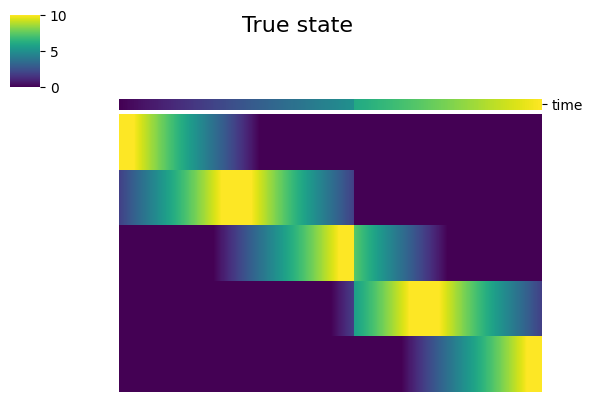

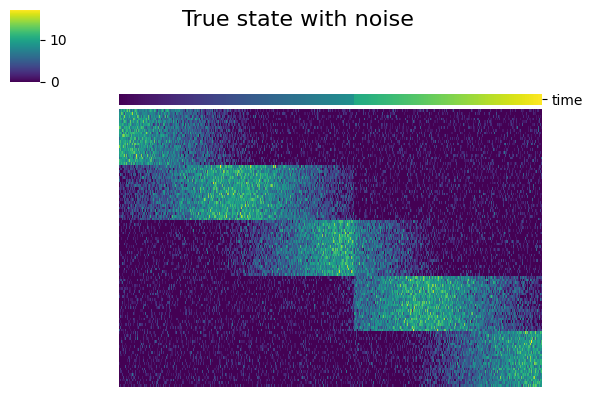

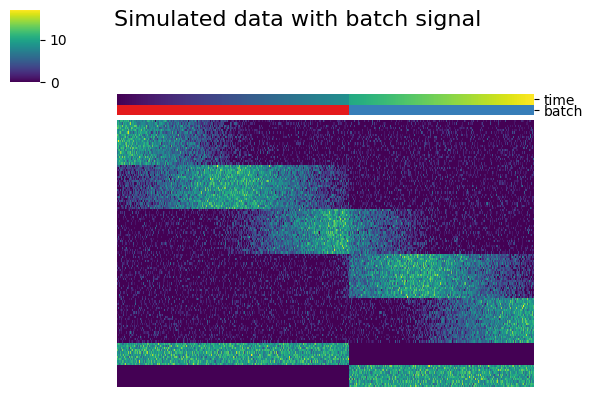

In [8]:
ccd.pl.heatmap_with_annotations(adata_state, val='no_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state', save_path=save_dir/f'true_state_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata_state, val='wt_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state with noise', save_path=save_dir/f'true_state_with_noise_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Simulated data with batch signal', save_path=save_dir/f'simulated_data_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)

### No batch effect, no noise

In [9]:
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_no_noise', result_key='UMAP_no_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_no_noise']


In [10]:
sc.pp.neighbors(adata_state, use_rep='PCA_no_noise', n_neighbors=30, random_state=seed)
sc.tl.leiden(adata_state, resolution=1.0, key_added=leiden_key, random_state=seed)
adata.obs[leiden_key] = adata_state.obs[leiden_key]

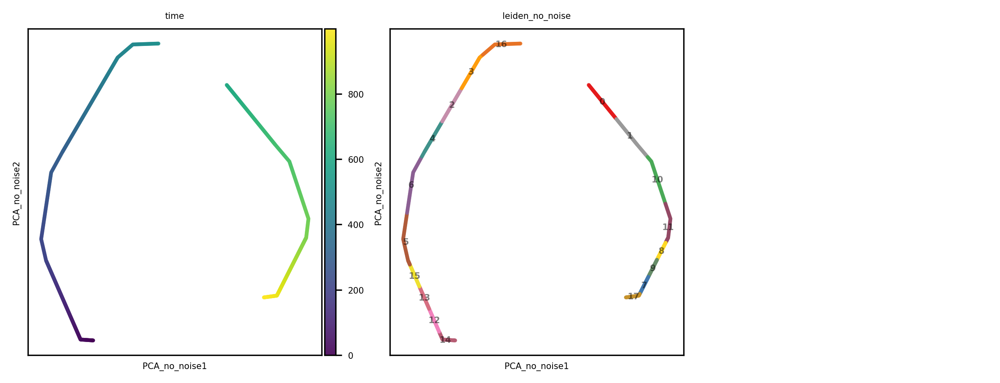

In [11]:
show_basis = 'PCA_no_noise'
show_cols = [state_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

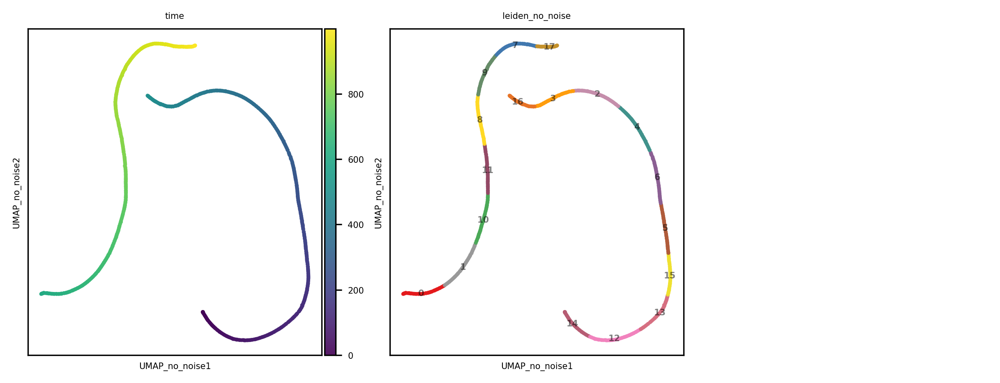

In [12]:
show_basis = 'UMAP_no_noise'
show_cols = [state_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

### NO batch effect, noise added, PCA and UMAP

In [13]:
adata_state.X = adata_state.layers['wt_noise'].copy()
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_wt_noise', result_key='UMAP_wt_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_wt_noise']


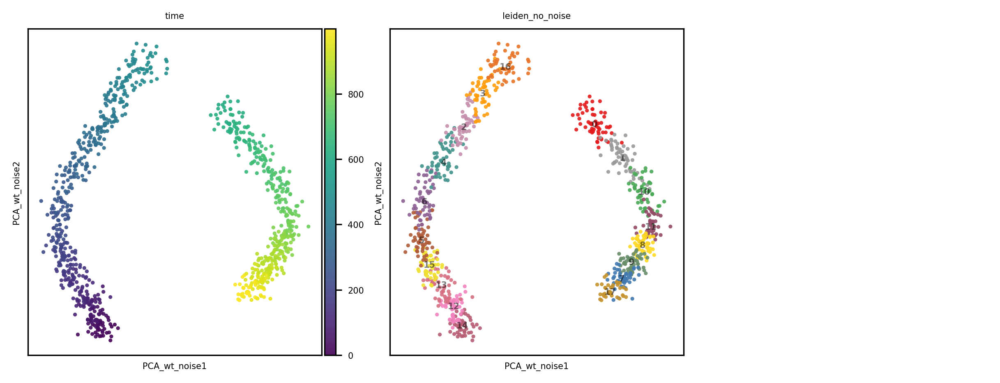

In [14]:
show_basis = 'PCA_wt_noise'
show_cols = [state_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

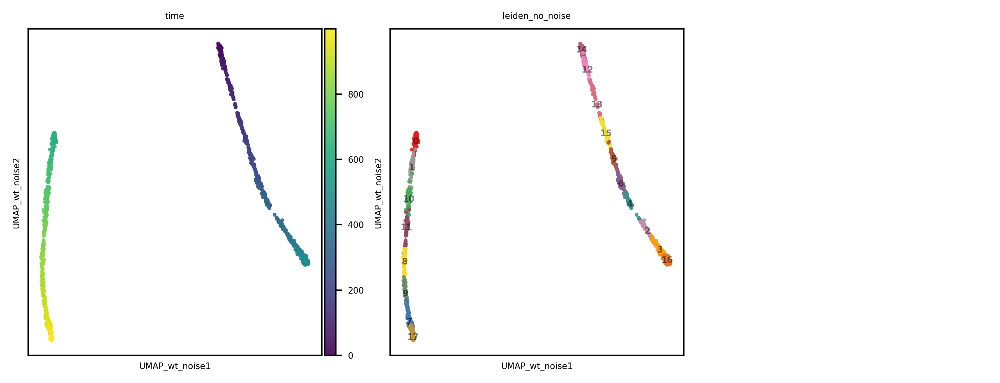

In [15]:
show_basis = 'UMAP_wt_noise'
show_cols = [state_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

### No batch correction, PCA and UMAP

In [16]:
n_pcs = min(adata.n_obs, adata.n_vars)-1
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.5)
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

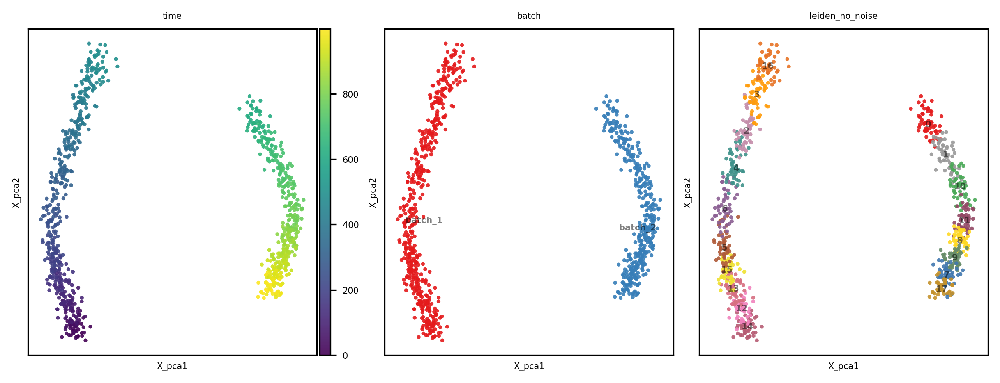

In [17]:
show_basis = 'X_pca'
show_cols = [state_key, batch_key, leiden_key]

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

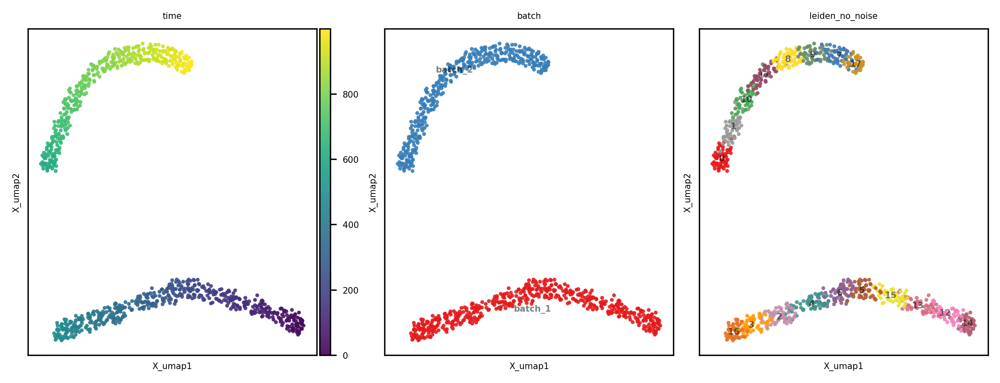

In [18]:
show_basis = 'X_umap'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [19]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'

cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 900 points to 30 centroids: please provide at least 1170 training points


p_intra_knn: 0.3


Epoch 0 Training: 13it [00:00, 20.51it/s, loss=4.45]
Epoch 9 Training: 100%|██████████| 13/13 [00:00<00:00, 96.60it/s, loss=4.18]


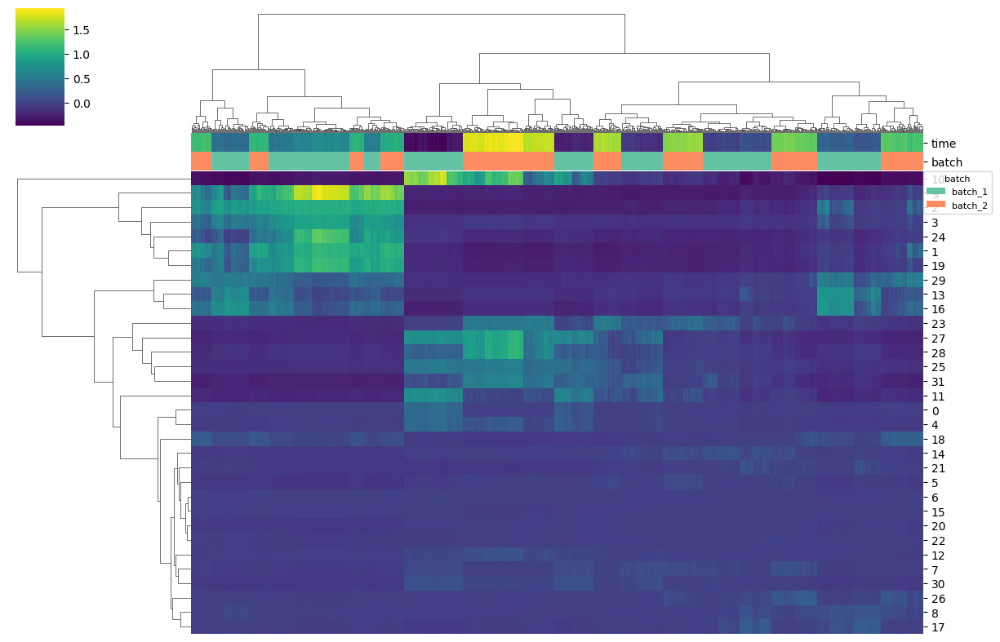

In [20]:
ccd.pl.heatmap_with_annotations(adata, val='Concord', obs_keys=[state_key, batch_key], 
                                cluster_cols=True, cluster_rows=True, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'Concord_latent_heatmap_{file_suffix}.png')

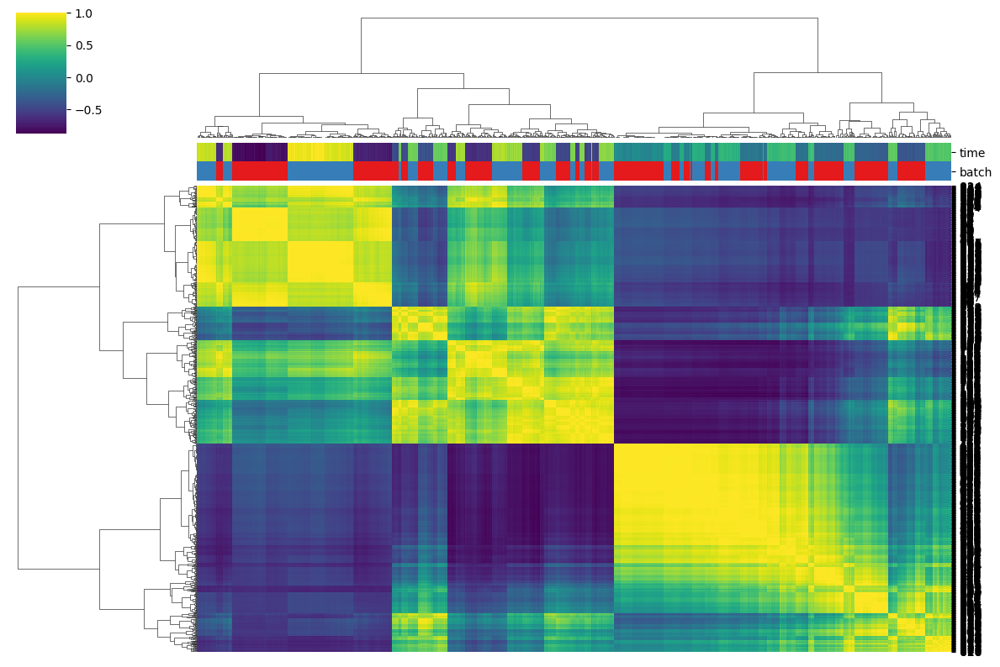

In [21]:
# Compute the correlation matrix
cos_mtx = ccd.ul.cosine_sim(adata.obsm['Concord'])
ccd.pl.heatmap_with_annotations(adata, val=cos_mtx,
                                obs_keys=[state_key, batch_key], cluster_cols=True, cluster_rows=True, cmap='viridis', save_path=save_dir/f'Concord_cosine_{file_suffix}.png')

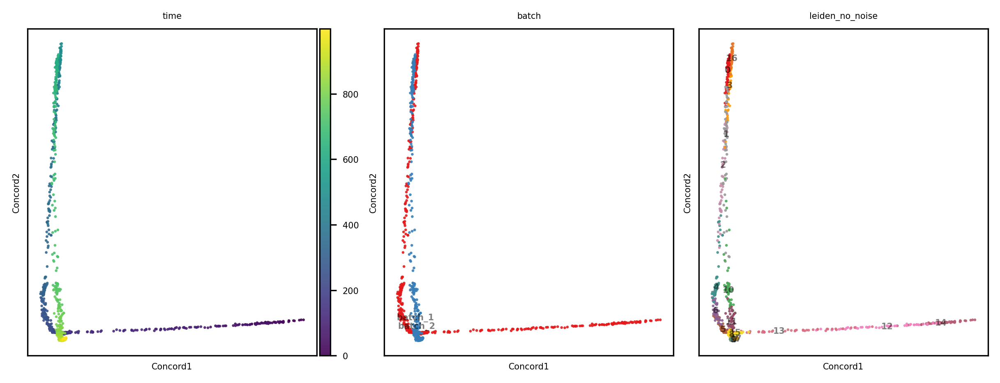

In [22]:
n_pc = min(adata.obsm[output_key].shape[1], adata.shape[0]) - 1
ccd.ul.run_pca(adata, source_key=output_key, result_key=f'{output_key}_PCA', n_pc=n_pc, random_state=seed)
show_basis = f'{output_key}'
show_cols = [state_key, batch_key, leiden_key]
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

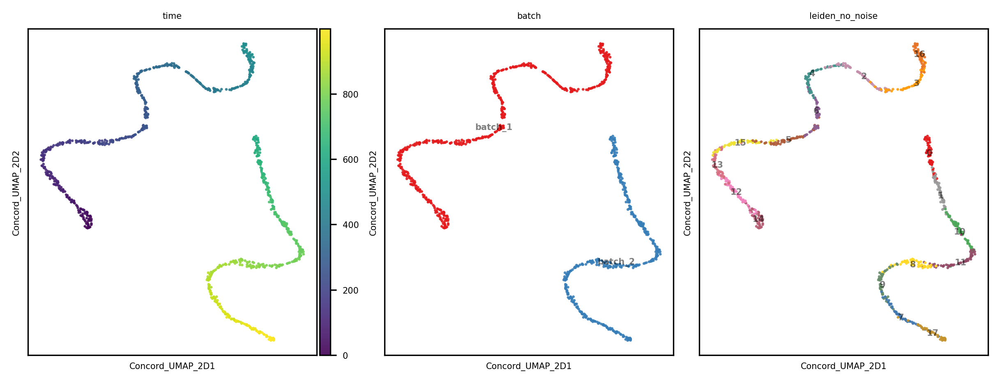

In [23]:
sc.pp.neighbors(adata, n_neighbors=30, use_rep = 'Concord')
ccd.ul.run_umap(adata, source_key='Concord', result_key='Concord_UMAP_2D', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)

show_cols = [state_key, batch_key, leiden_key]
show_basis = 'Concord_UMAP_2D'   
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    #pal = {'cluster':'Set1', 'batch':'Set2', 'leiden':'tab20'},
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)


In [24]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad") 
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")

In [25]:
file_suffix

'Nov16-1411'

# Run other methods

In [10]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
ccd.set_verbose_mode(True)
show_cols = [state_key, batch_key]
timer = ccd.ul.Timer()
time_log = {}

### Scanorama

In [27]:
output_key = 'Scanorama'

with timer:
    ccd.ul.run_scanorama(adata, batch_key="batch", output_key=output_key, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

Found 120 genes among all datasets
[[0.    0.395]
 [0.    0.   ]]
Processing datasets (0, 1)
Found 120 genes among all datasets
[[0.    0.395]
 [0.    0.   ]]
Processing datasets (0, 1)


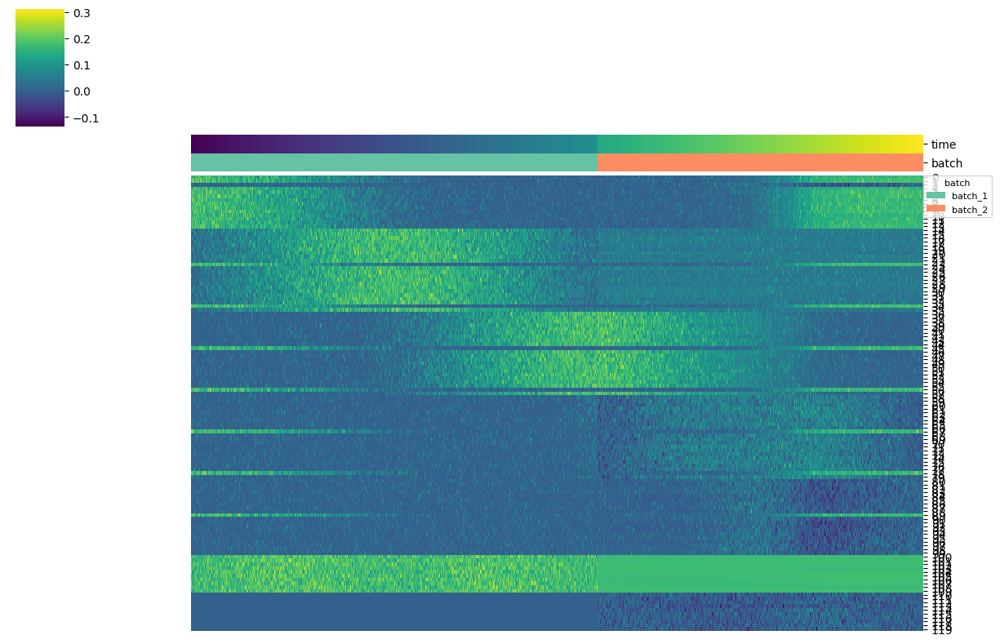

In [28]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Scanorama_UMAP']


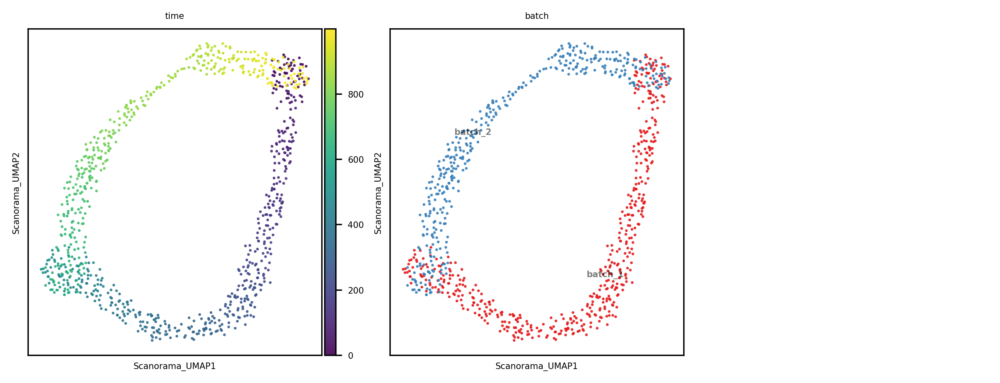

In [29]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Liger

In [30]:
output_key = 'Liger'
adata.layers["counts"] = adata.X.copy()
with timer:
    ccd.ul.run_liger(adata, batch_key="batch", count_layer="counts", output_key=output_key, k=30, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

100%|██████████| 30/30 [00:04<00:00,  7.40it/s]


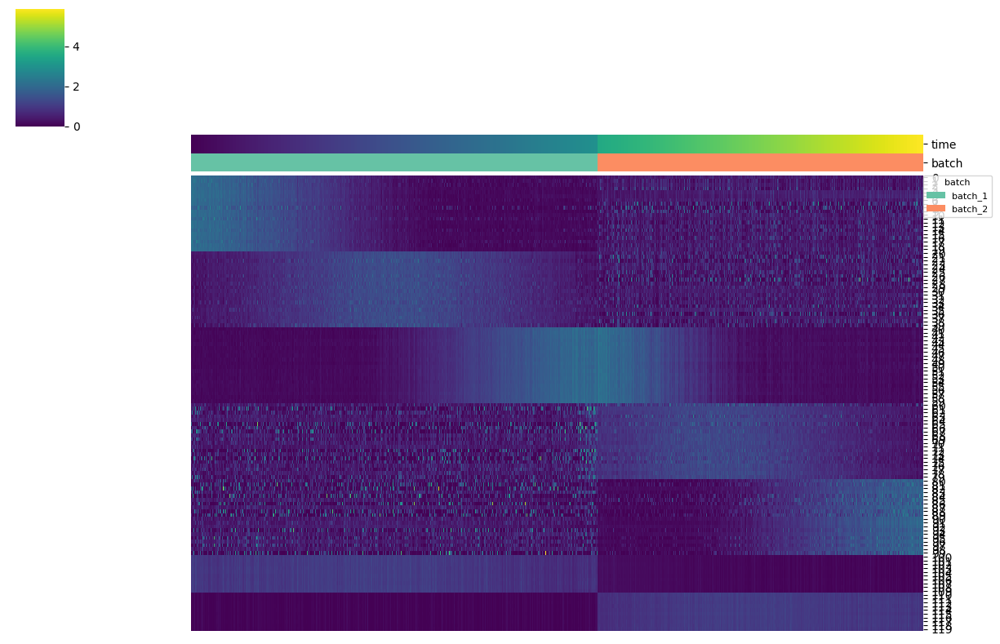

In [31]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Liger_UMAP']


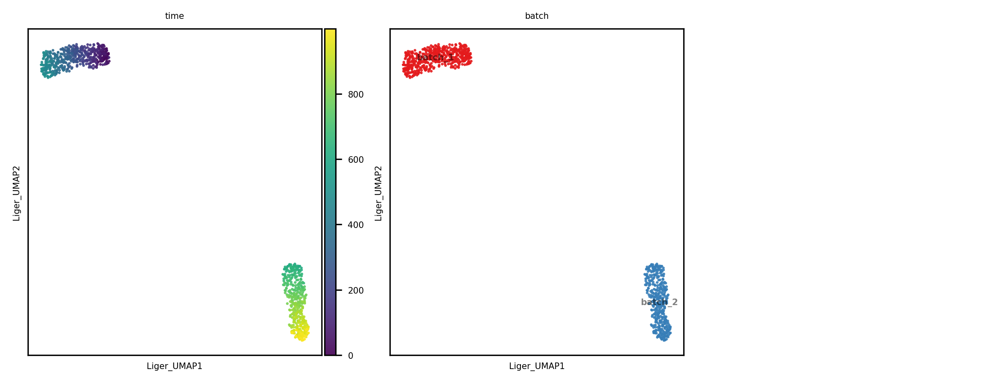

In [32]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Harmony

In [33]:
output_key = 'Harmony'
with timer:
    ccd.ul.run_harmony(adata, batch_key="batch", input_key='X_pca', output_key=output_key)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


Concord - INFO - UMAP embedding stored in adata.obsm['Harmony_UMAP']


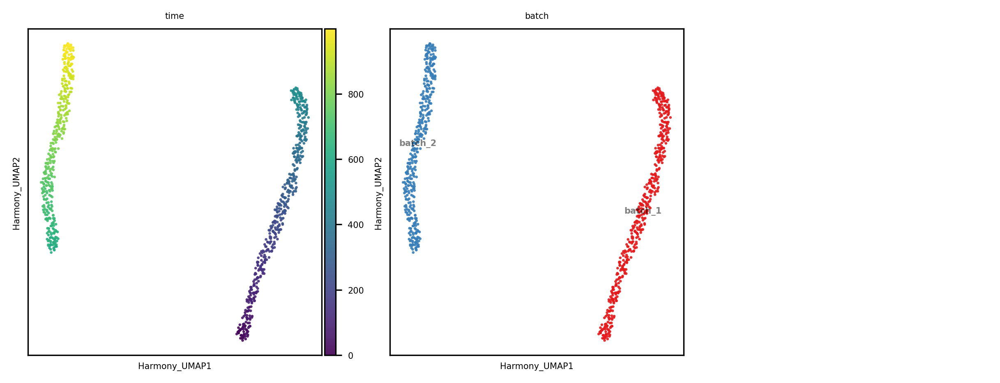

In [34]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scVI

In [35]:
output_key = 'scVI'
transform_batch = 'batch_1'
with timer:
    scvi_vae = ccd.ul.run_scvi(adata, batch_key="batch", output_key=output_key, return_model=True, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 400/400: 100%|██████████| 400/400 [00:41<00:00,  9.26it/s, v_num=1, train_loss_step=191, train_loss_epoch=187]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:41<00:00,  9.64it/s, v_num=1, train_loss_step=191, train_loss_epoch=187]


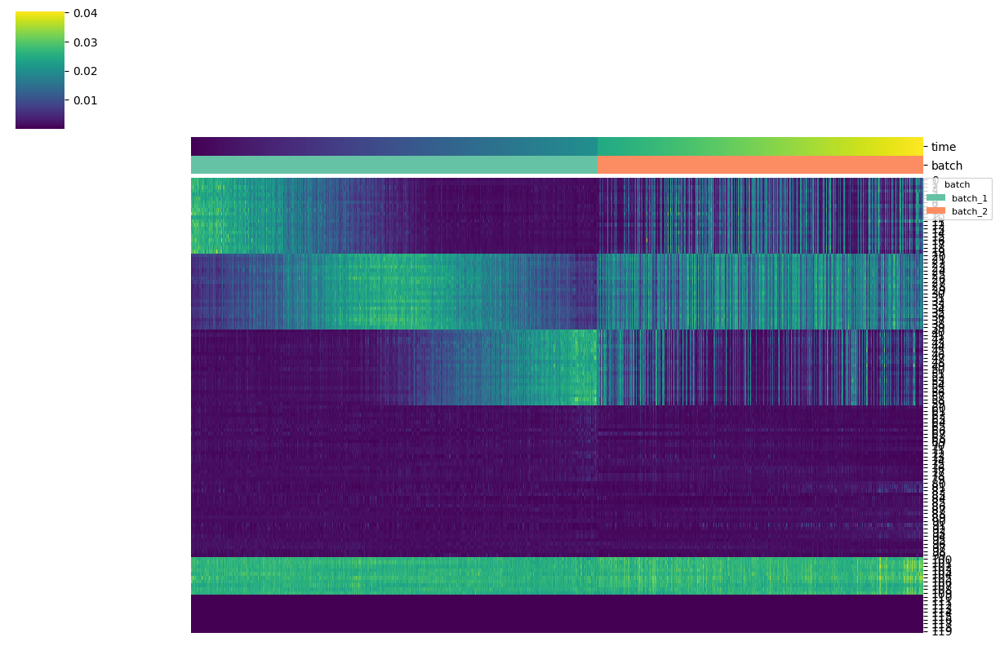

In [36]:
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scVI_UMAP']


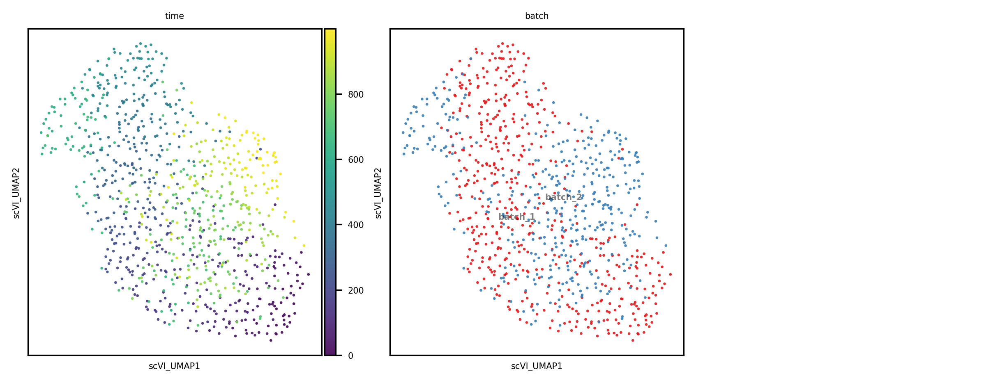

In [37]:
output_key = 'scVI'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scANVI

In [38]:
output_key = 'scANVI'
with timer:
    ccd.ul.run_scanvi(adata, batch_key="batch", labels_key=leiden_key, output_key=output_key, scvi_model=scvi_vae, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

INFO     Training for 20 epochs.                                                                                   


Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 20/20: 100%|██████████| 20/20 [00:04<00:00,  4.29it/s, v_num=1, train_loss_step=203, train_loss_epoch=200]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:04<00:00,  4.30it/s, v_num=1, train_loss_step=203, train_loss_epoch=200]


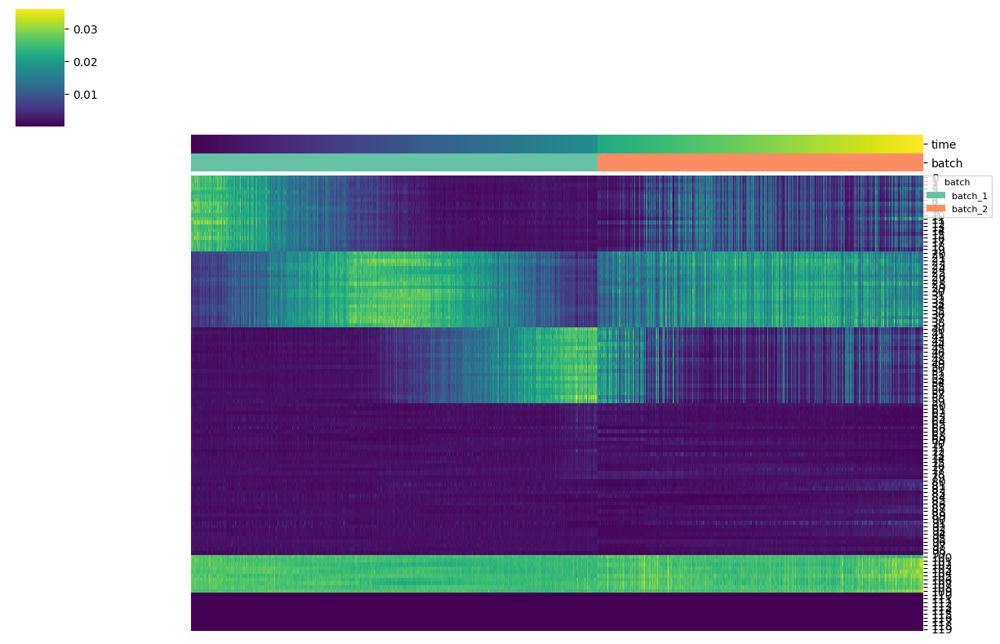

In [39]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scANVI_UMAP']


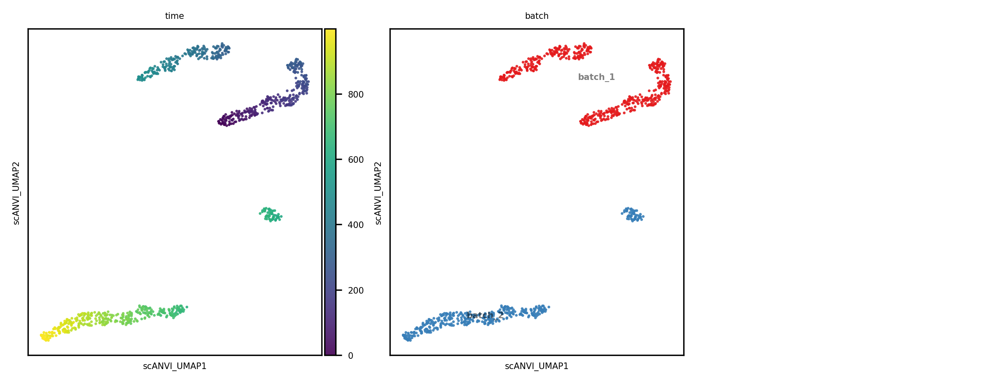

In [40]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord

In [ ]:
min_p_intra_domain=0.9

In [ ]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      min_p_intra_domain=min_p_intra_domain, # probability of sampling intra-domain pairs
                      seed=seed, # random seed
                      verbose=True, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval

# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - INFO - Setting sampler_knn to 90 to be 1/10 the number of cells in the dataset. You can change this value by setting sampler_knn in the configuration.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - INFO - Proceeding with all 120 features in the dataset.
Concord - INFO - Column 'batch' is already of type: category
Concord - INFO - Unused levels dropped for column 'batch'.
Concord - INFO - Encoder input dim: 120
Concord - INFO - Model loaded to device: cuda:3
Concord - INFO - Total number of parameters: 19952
Concord.model.anndataset - INFO - Initialized dataset with 900 samples. Data structure: ['input', 'domain', 'idx']
Concord - INFO - Using existing embedding 'X_pca' from adata.obsm
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss IVF index. nprobe=10
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.dataloader 

WARNING clustering 900 points to 30 centroids: please provide at least 1170 training points


Concord.model.dataloader - INFO - Converting coverage {'batch_1': 0.5555555555555556, 'batch_2': 0.4444444444444444} to p_intra_domain...
Concord.model.dataloader - INFO - Final p_intra_domain values: batch_1: 0.98, batch_2: 0.97
p_intra_knn: 0.5
Concord - INFO - Starting epoch 1/20
Concord - INFO - Processing chunk 1/1 for epoch 1
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 0 Training: 13it [00:00, 111.57it/s, loss=4.39]

Concord - INFO - Epoch   0 | Train Loss: 4.59, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.59, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/20
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 1 Training: 100%|██████████| 13/13 [00:00<00:00, 112.62it/s, loss=4.3] 

Concord - INFO - Epoch   1 | Train Loss: 4.34, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.34, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/20


Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 2 Training: 100%|██████████| 13/13 [00:00<00:00, 112.26it/s, loss=4.24]

Concord - INFO - Epoch   2 | Train Loss: 4.28, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.28, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 4/20
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 3 Training: 100%|██████████| 13/13 [00:00<00:00, 96.19it/s, loss=4.12]

Concord - INFO - Epoch   3 | Train Loss: 4.26, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.26, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 5/20
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 4 Training: 100%|██████████| 13/13 [00:00<00:00, 53.12it/s, loss=4.13]

Concord - INFO - Epoch   4 | Train Loss: 4.25, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.25, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 6/20
Concord - INFO - Processing chunk 1/1 for epoch 6
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 5 Training: 100%|██████████| 13/13 [00:00<00:00, 100.98it/s, loss=4.08]

Concord - INFO - Epoch   5 | Train Loss: 4.19, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.19, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 7/20
Concord - INFO - Processing chunk 1/1 for epoch 7
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 6 Training: 100%|██████████| 13/13 [00:00<00:00, 101.74it/s, loss=4.12]

Concord - INFO - Epoch   6 | Train Loss: 4.16, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.16, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 8/20
Concord - INFO - Processing chunk 1/1 for epoch 8


Concord - INFO - Number of samples in train_dataloader: 900


Epoch 7 Training: 100%|██████████| 13/13 [00:00<00:00, 101.04it/s, loss=4.18]

Concord - INFO - Epoch   7 | Train Loss: 4.18, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.18, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 9/20
Concord - INFO - Processing chunk 1/1 for epoch 9
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 8 Training: 100%|██████████| 13/13 [00:00<00:00, 88.17it/s, loss=4.23]

Concord - INFO - Epoch   8 | Train Loss: 4.14, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.14, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 10/20


Concord - INFO - Processing chunk 1/1 for epoch 10
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 9 Training: 100%|██████████| 13/13 [00:02<00:00,  5.72it/s, loss=4.07]

Concord - INFO - Epoch   9 | Train Loss: 4.07, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.07, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 11/20
Concord - INFO - Processing chunk 1/1 for epoch 11
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 10 Training: 100%|██████████| 13/13 [00:00<00:00, 89.83it/s, loss=4.24]

Concord - INFO - Epoch  10 | Train Loss: 4.12, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.12, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 12/20
Concord - INFO - Processing chunk 1/1 for epoch 12


Concord - INFO - Number of samples in train_dataloader: 900


Epoch 11 Training: 100%|██████████| 13/13 [00:00<00:00, 97.86it/s, loss=4.16]

Concord - INFO - Epoch  11 | Train Loss: 4.08, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.08, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 13/20


Concord - INFO - Processing chunk 1/1 for epoch 13
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 12 Training: 100%|██████████| 13/13 [00:00<00:00, 99.63it/s, loss=4.06]

Concord - INFO - Epoch  12 | Train Loss: 4.07, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.07, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 14/20
Concord - INFO - Processing chunk 1/1 for epoch 14
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 13 Training: 100%|██████████| 13/13 [00:00<00:00, 102.82it/s, loss=3.99]

Concord - INFO - Epoch  13 | Train Loss: 4.06, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.06, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 15/20
Concord - INFO - Processing chunk 1/1 for epoch 15
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 14 Training: 100%|██████████| 13/13 [00:00<00:00, 99.23it/s, loss=4.12]

Concord - INFO - Epoch  14 | Train Loss: 4.14, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.14, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 16/20
Concord - INFO - Processing chunk 1/1 for epoch 16
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 15 Training: 100%|██████████| 13/13 [00:00<00:00, 39.07it/s, loss=4.09]

Concord - INFO - Epoch  15 | Train Loss: 4.09, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.09, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 17/20
Concord - INFO - Processing chunk 1/1 for epoch 17
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 16 Training: 100%|██████████| 13/13 [00:00<00:00, 76.31it/s, loss=4.17]

Concord - INFO - Epoch  16 | Train Loss: 4.09, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.09, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 18/20
Concord - INFO - Processing chunk 1/1 for epoch 18
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 17 Training: 100%|██████████| 13/13 [00:00<00:00, 55.83it/s, loss=3.98]

Concord - INFO - Epoch  17 | Train Loss: 4.04, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.04, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 19/20
Concord - INFO - Processing chunk 1/1 for epoch 19
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 18 Training: 100%|██████████| 13/13 [00:00<00:00, 74.38it/s, loss=4.13]

Concord - INFO - Epoch  18 | Train Loss: 4.12, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.12, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 20/20
Concord - INFO - Processing chunk 1/1 for epoch 20
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 19 Training: 100%|██████████| 13/13 [00:00<00:00, 30.86it/s, loss=4.07]

Concord - INFO - Epoch  19 | Train Loss: 4.10, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.10, IMPORTANCE: 0.00
Concord - INFO - Model saved to ../save/dev_simulation_trajectory_wtgap-Nov26/final_model.pth
Concord - INFO - Final model saved at: ../save/dev_simulation_trajectory_wtgap-Nov26/final_model.pth; Configuration saved at: ../save/dev_simulation_trajectory_wtgap-Nov26/config.json.
Concord.model.anndataset - INFO - Initialized dataset with 900 samples. Data structure: ['input', 'domain', 'idx']


Concord - INFO - Predicting for chunk 1/1


Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP']


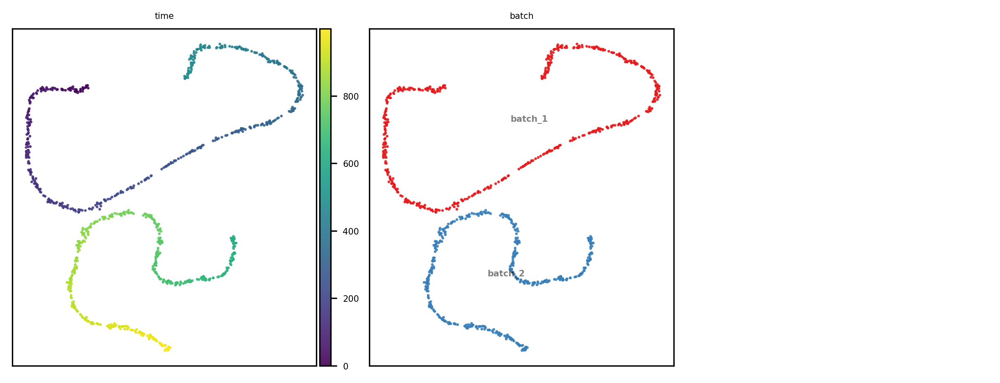

In [17]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

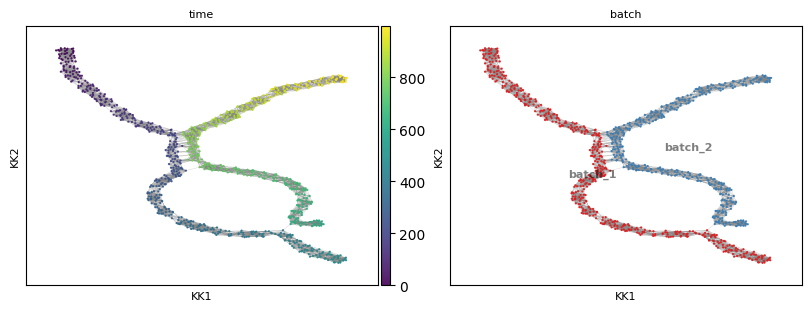

In [19]:
ccd.pl.plot_graph(adata, basis=output_key, color_by = show_cols, edges=True, k=20, ncols=2, figsize=(8,3), dpi=100)

### Concord with decoder

In [63]:
decoder_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      class_key=leiden_key, # key indicating class
                      use_classifier=False, # use classifier
                      use_decoder=True,
                      min_p_intra_domain=min_p_intra_domain, # probability of sampling intra-domain pairs
                      domain_embedding_dim=8,
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

output_key = 'Concord-decoder'
with timer:
    decoder_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(decoder_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")


Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 900 points to 30 centroids: please provide at least 1170 training points


p_intra_knn: 0.5


Epoch 0 Training: 13it [00:00, 81.17it/s, loss=14.4]
Epoch 9 Training: 100%|██████████| 13/13 [00:00<00:00, 82.39it/s, loss=7.09]


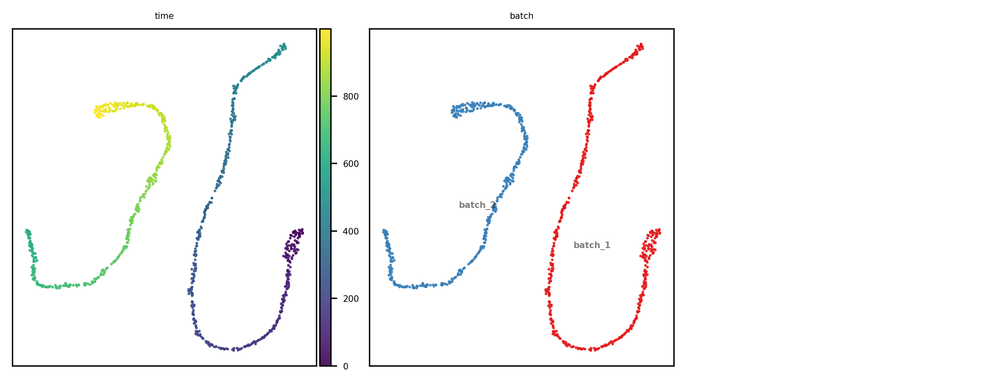

In [64]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [65]:
# Predict and store the results
decoder_domains = adata.obs[batch_key].unique()
for domain in decoder_domains:
    _, decoded, _, _, _, _ = decoder_ccd.predict(decoder_ccd.loader, return_decoded=True, decoder_domain=domain, return_class=True, return_class_prob=True)
    save_key = f"{output_key}_decoded_{domain}"
    adata.layers[save_key] = decoded

adata.layers

Layers with keys: Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2, Liger_corrected, Scanorama_corrected, counts, scANVI_corrected_batch_1, scVI_corrected_batch_1, wt_noise, no_noise

### Concord with classifier

In [66]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      class_key=leiden_key, # key indicating class
                      use_classifier=True, # use classifier
                      seed=seed, # random seed
                      min_p_intra_domain=min_p_intra_domain, # probability of sampling intra-domain pairs
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord-class'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 900 points to 30 centroids: please provide at least 1170 training points


p_intra_knn: 0.5


Epoch 0 Training: 13it [00:00, 89.15it/s, loss=7.29]
Epoch 9 Training: 100%|██████████| 13/13 [00:00<00:00, 80.55it/s, loss=5.31]


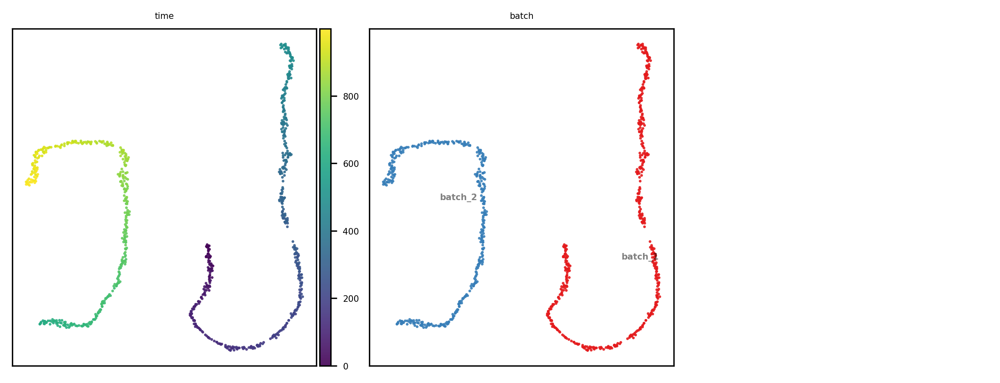

In [67]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Contrastive

In [6]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=None, # key indicating batch
                      min_p_intra_domain=None, # probability of sampling intra-domain pairs
                      seed=seed, # random seed
                      verbose=True, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord_nd'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)


Concord - INFO - Setting sampler_knn to 18 to be 1/50 the number of cells in the dataset. You can change this value by setting sampler_knn in the configuration.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - INFO - Proceeding with all 120 features in the dataset.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (18). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (60)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord - INFO - Encoder input dim: 120
Concord - INFO - Model loaded to device: cpu
Concord - INFO - Total number of parameters: 19944
Concord.model.anndataset - INFO

p_intra_knn: 0.3
Concord - INFO - Starting epoch 1/10
Concord - INFO - Processing chunk 1/1 for epoch 1
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 0 Training: 14it [00:00, 46.51it/s, loss=4]   

Concord - INFO - Epoch   0 | Train Loss: 4.23, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.23, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/10
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 1 Training: 100%|██████████| 14/14 [00:00<00:00, 202.88it/s, loss=3.97]

Concord - INFO - Epoch   1 | Train Loss: 3.98, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.98, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/10
Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 2 Training: 100%|██████████| 14/14 [00:00<00:00, 199.35it/s, loss=3.86]

Concord - INFO - Epoch   2 | Train Loss: 3.90, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.90, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 4/10
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 3 Training: 100%|██████████| 14/14 [00:00<00:00, 191.60it/s, loss=3.83]

Concord - INFO - Epoch   3 | Train Loss: 3.86, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.86, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 5/10


Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 900


Epoch 4 Training: 100%|██████████| 14/14 [00:00<00:00, 196.04it/s, loss=3.81]

Concord - INFO - Epoch   4 | Train Loss: 3.78, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.78, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 6/10
Concord - INFO - Processing chunk 1/1 for epoch 6


Concord - INFO - Number of samples in train_dataloader: 900


Epoch 5 Training: 100%|██████████| 14/14 [00:00<00:00, 201.23it/s, loss=3.78]

Concord - INFO - Epoch   5 | Train Loss: 3.77, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.77, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 7/10
Concord - INFO - Processing chunk 1/1 for epoch 7
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 6 Training: 100%|██████████| 14/14 [00:00<00:00, 216.87it/s, loss=3.67]

Concord - INFO - Epoch   6 | Train Loss: 3.75, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.75, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 8/10
Concord - INFO - Processing chunk 1/1 for epoch 8
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 7 Training: 100%|██████████| 14/14 [00:00<00:00, 185.08it/s, loss=3.81]

Concord - INFO - Epoch   7 | Train Loss: 3.74, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.74, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 9/10
Concord - INFO - Processing chunk 1/1 for epoch 9
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 8 Training: 100%|██████████| 14/14 [00:00<00:00, 304.18it/s, loss=3.7]

Concord - INFO - Epoch   8 | Train Loss: 3.74, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.74, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 10/10
Concord - INFO - Processing chunk 1/1 for epoch 10
Concord - INFO - Number of samples in train_dataloader: 900



Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 300.34it/s, loss=3.77]

Concord - INFO - Epoch   9 | Train Loss: 3.74, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.74, IMPORTANCE: 0.00
Concord - INFO - Model saved to ../save/dev_simulation_trajectory_wtgap-Feb16/final_model_Feb16-1623.pt
Concord - INFO - Final model saved at: ../save/dev_simulation_trajectory_wtgap-Feb16/final_model_Feb16-1623.pt; Configuration saved at: ../save/dev_simulation_trajectory_wtgap-Feb16/config_Feb16-1623.json.
Concord.model.anndataset - INFO - Initialized dataset with 900 samples. Data structure: ['input', 'domain', 'idx']


Concord - INFO - Predicting for chunk 1/1


In [ ]:
adata.obsm['Unintegrated'] = adata.obsm['X_pca']
n_pc=30
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=n_pc, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=n_pc, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm

AxisArrays with keys: X_pca, X_umap, Unintegrated, Concord, Concord_PCA, Concord_UMAP_2D, Scanorama, Scanorama_UMAP, Liger, Liger_UMAP, Harmony, Harmony_UMAP, scVI, scVI_UMAP, scANVI, scANVI_UMAP, Concord_UMAP, Concord-decoder, Concord-decoder_UMAP, Concord-class, Concord-class_UMAP, PCA_no_noise, PCA_wt_noise

In [7]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI","Concord_nd", "Concord", 'Concord-decoder', "Concord-class",  "scANVI"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = ground_keys + latent_keys 


In [ ]:

# Run umap and PCA for all latent embeddings
for basis in combined_keys:
    print("Running UMAP and PCA for", basis)
    if basis not in adata.obsm:
        continue
    #if 'UMAP' not in basis:
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=.8, metric='euclidean', random_state=seed)
    if 'PCA' not in basis:
        n_pc = min(adata.obsm[basis].shape[1], adata.shape[0]) - 1
        ccd.ul.run_pca(adata, source_key=basis, result_key=f'{basis}_PCA', n_pc=n_pc, random_state=seed)


Running UMAP and PCA for PCA_no_noise
Concord - INFO - UMAP embedding stored in adata.obsm['PCA_no_noise_UMAP']
Running UMAP and PCA for PCA_wt_noise
Concord - INFO - UMAP embedding stored in adata.obsm['PCA_wt_noise_UMAP']
Running UMAP and PCA for Unintegrated
Concord - INFO - UMAP embedding stored in adata.obsm['Unintegrated_UMAP']
Concord - INFO - PCA performed on source data with 118 components
Concord - INFO - PCA embedding stored in adata.obsm['Unintegrated_PCA']
Running UMAP and PCA for Scanorama
Concord - INFO - UMAP embedding stored in adata.obsm['Scanorama_UMAP']
Concord - INFO - PCA performed on source data with 99 components
Concord - INFO - PCA embedding stored in adata.obsm['Scanorama_PCA']
Running UMAP and PCA for Liger
Concord - INFO - UMAP embedding stored in adata.obsm['Liger_UMAP']
Concord - INFO - PCA performed on source data with 29 components
Concord - INFO - PCA embedding stored in adata.obsm['Liger_PCA']
Running UMAP and PCA for Harmony
Concord - INFO - UMAP emb

In [10]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")
file_suffix

'Feb07-2131'

Concord.plotting.pl_embedding - INFO - Plotting PCA_no_noise with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting PCA_wt_noise with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Unintegrated with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Scanorama with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Liger with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Harmony with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting scVI with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord_nd with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-decoder with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-class with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting scANVI with time in KNN


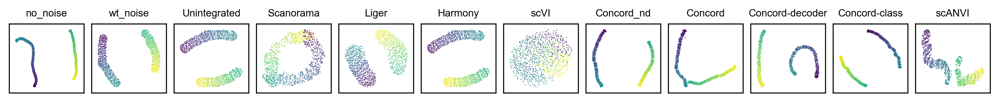

Concord.plotting.pl_embedding - INFO - Plotting PCA_no_noise with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting PCA_wt_noise with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Unintegrated with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Scanorama with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Liger with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Harmony with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting scVI with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord_nd with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-decoder with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-class with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting scANVI with batch in KNN


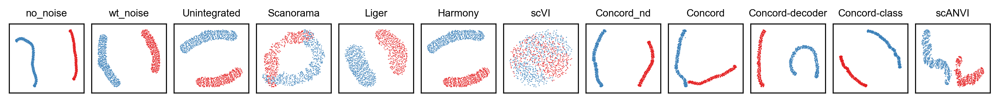

In [19]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd


# from matplotlib import font_manager, rcParams

# # Add custom font path
# font_dirs = ['/wynton/home/gartner/zhuqin/.conda/envs/cellpath/fonts']  # Your custom fonts directory
# font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

# # Create FontProperties for each custom font and add to the font manager
# for font_path in font_files:
#     font_manager.fontManager.addfont(font_path)

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

color_bys = ['time', 'batch']
# basis_types = ['PCA']
basis_types = ['KNN']
#basis_types = ['UMAP']
font_size=8
point_size=2.5
alpha=0.8
figsize=(0.9*len(combined_keys),1)
ncols = len(combined_keys)
nrows = int(np.ceil(len(combined_keys) / ncols))
pal = {'time':'viridis', 'batch':'Set1'}
k=15
k=30
edges_color='grey'
edges_width=0.0
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

rasterized = True
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        combined_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        rasterized=rasterized,
        figsize=figsize,
        ncols=ncols,
        seed=2,
        leiden_key='leiden',
        save_dir=save_dir,
        file_suffix=file_suffix+f'rasterized_{rasterized}'+f'_knn_{k}',
        save_format='svg'
    )


In [28]:
adata.layers['no_noise'] = np.zeros_like(adata.X)
adata.layers['wt_noise'] = np.zeros_like(adata.X)
# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()
adata.layers['wt_noise'][:, adata_indices] = adata_state.layers['wt_noise'][:, adata_state_indices].copy()

# sort and smooth the signal along the path
#batch_id=adata.obs['batch'].unique()[0]
cell_order = adata.obs['time'].argsort()
_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord', path=cell_order, sigma=2)
adata.obsm['Concord_sorted'] = adata.obsm['Concord'][:, feature_order]

_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord-decoder', path=cell_order, sigma=2)
adata.obsm['Concord-decoder_sorted'] = adata.obsm['Concord-decoder'][:, feature_order]

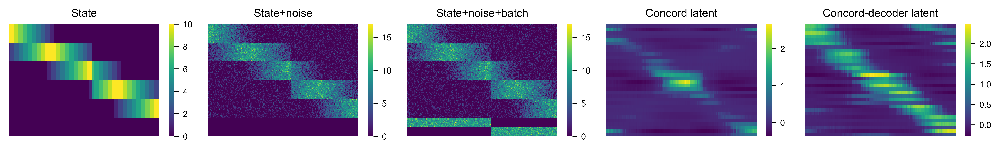

In [32]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
dpi = 600
with plt.rc_context(rc=custom_rc):
    fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
    ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='Concord-decoder_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord-decoder latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    plt.tight_layout(w_pad=0.0, h_pad=0.1)
    plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

In [ ]:
adata_time_sorted = adata[cell_order]
ccd.pl.heatmap_with_annotations(adata_time_sorted, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=True, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', 
                                save_path=save_dir/f'Concord_sorted_heatmap_{file_suffix}.svg', figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)

# Evaluation

In [5]:
adata = sc.read(data_dir / f"adata_Nov24-2111.h5ad")
adata_state = sc.read(data_dir / f"adata_state_Nov24-2111.h5ad")

### Scib

In [72]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=leiden_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

Computing neighbors:   0%|          | 0/9 [00:11<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

### Topology

Run topological analysis pipeline:

In [36]:
homology_dimensions = [0,1,2]
concord_keys = ['Concord', 'Concord-decoder', 'Concord-class']
#diagrams = {}
#for key in combined_keys:
for key in concord_keys:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for Concord
Computing persistent homology for Concord-decoder
Computing persistent homology for Concord-class


In [37]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"

PosixPath('../save/dev_simulation_trajectory_wtgap-Nov26/topology_diagrams_Nov26-1448.pkl')

In [ ]:
import pickle
with open(Path('../save/dev_simulation_trajectory_wtgap-Nov26') / f"topology_diagrams_Nov26-1448.pkl", 'rb') as f:
    diagrams = pickle.load(f)

Betti curve               Betti number
                    Entropy      Variance  L1 distance
Method                                                
Concord            1.977553   9420.614233            2
Concord-class      1.601414   9421.708400            1
Concord-decoder    1.326734   6327.217900            1
Harmony            2.472584  61875.169733            0
Liger              3.682148  50084.407967            1
PCA_no_noise       0.368207   4928.489167            0
PCA_wt_noise       2.472295  45205.895233            1
Scanorama          3.154717  61383.025033          898
Unintegrated       2.470036  61872.936900            0
scANVI             3.370880  38761.152067            1
scVI               3.718064  51475.355200            1

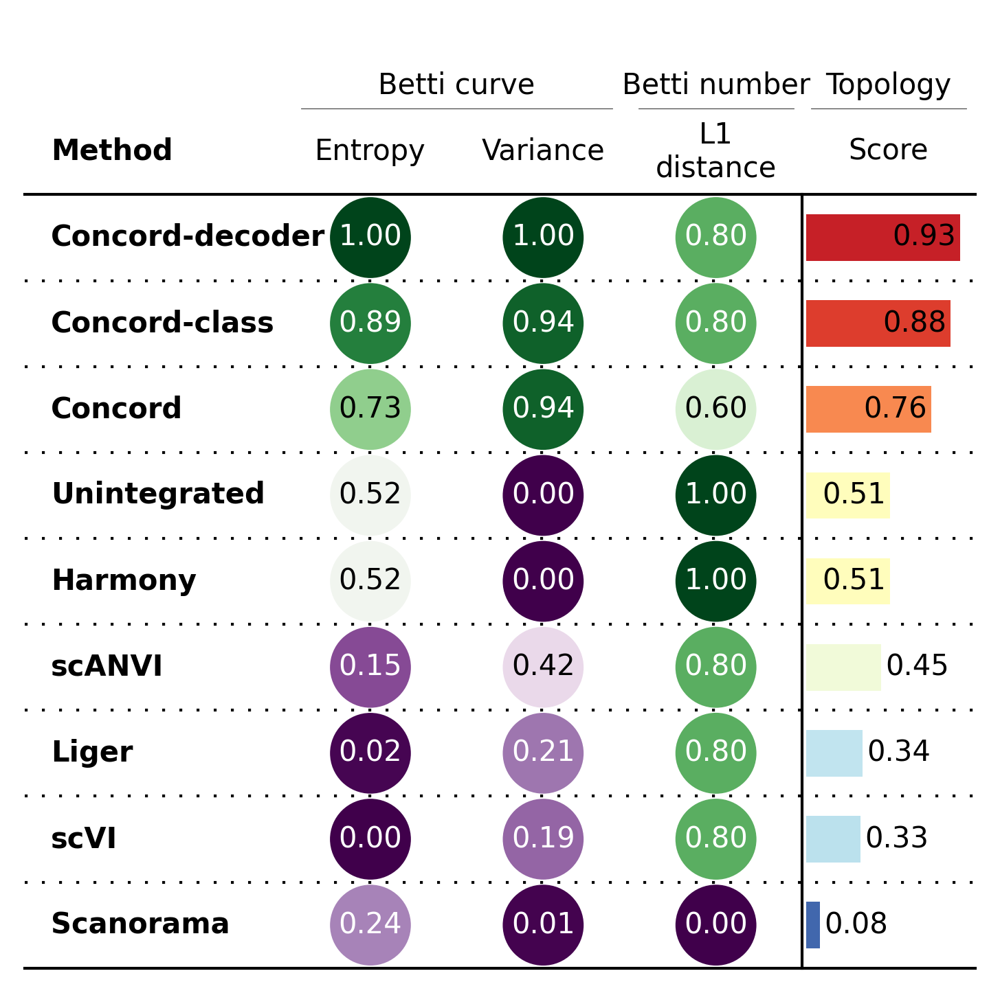

In [38]:
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=[1,0,0], save_dir=save_dir, file_suffix=file_suffix)
max_betti = 5
topology_metrics = topology_results['combined_metrics'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=5)
agg_name1 = 'Topology'
agg_name2 = 'Score'
topology_scores = ccd.ul.benchmark_stats_to_score(topology_metrics, min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 6), dpi=300)

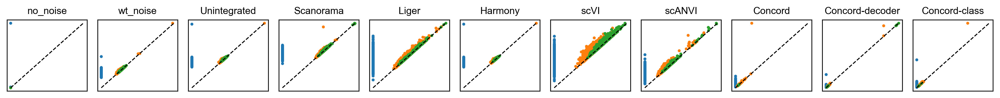

In [41]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('PCA_', ''): diagrams_ordered[key] for key in diagrams_ordered}
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=11, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

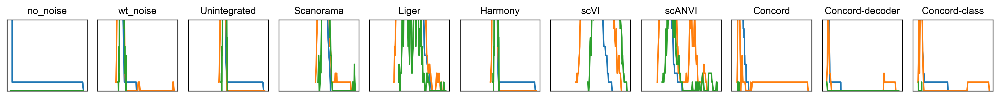

In [42]:
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=11, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

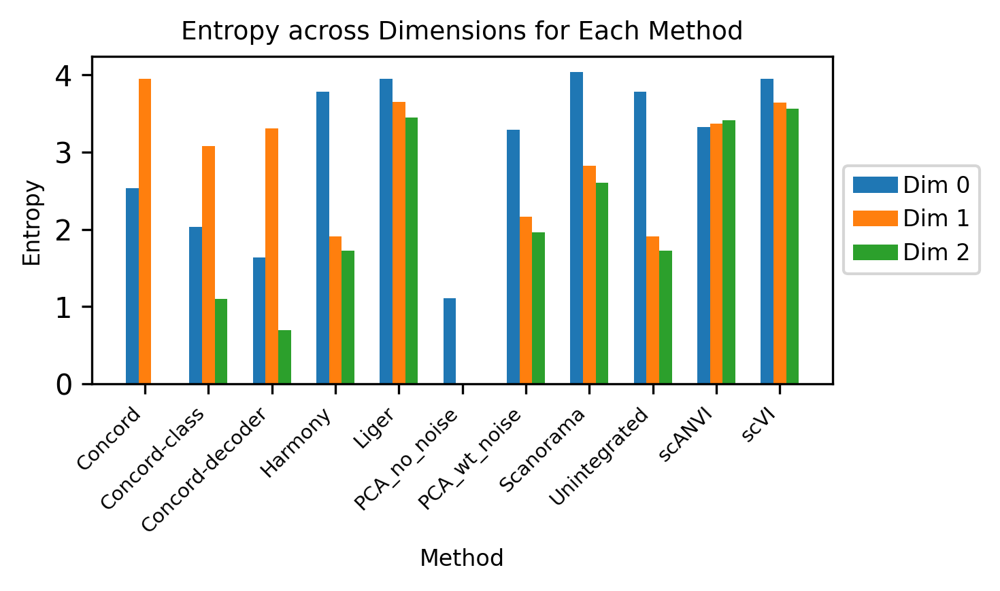

In [72]:
ccd.pl.plot_betti_statistic(topology_results['betti_stats'], statistic='Entropy', pal='tab10',
                            figsize=(5, 3), dpi=300, 
                             save_path=save_dir / f"betti_entropy_{file_suffix}.pdf")

In [73]:
topology_results['distance_metrics']

,L1 Distance,L2 Distance,Total Relative Error,Observed Betti Numbers,Expected Betti Numbers
Method,,,,,
Unintegrated,0,0.000000,0.0,"1, 0, 0","1, 0, 0"
Scanorama,898,898.000000,898.0,"899, 0, 0","1, 0, 0"
Liger,1,1.000000,1.0,"0, 0, 0","1, 0, 0"
Harmony,0,0.000000,0.0,"1, 0, 0","1, 0, 0"
scVI,1,1.000000,1.0,"0, 0, 0","1, 0, 0"
scANVI,1,1.000000,1.0,"0, 0, 0","1, 0, 0"
Concord,2,1.414214,1.0,"0, 1, 0","1, 0, 0"
Concord-decoder,1,1.000000,1.0,"0, 0, 0","1, 0, 0"
Concord-class,1,1.000000,1.0,"0, 0, 0","1, 0, 0"


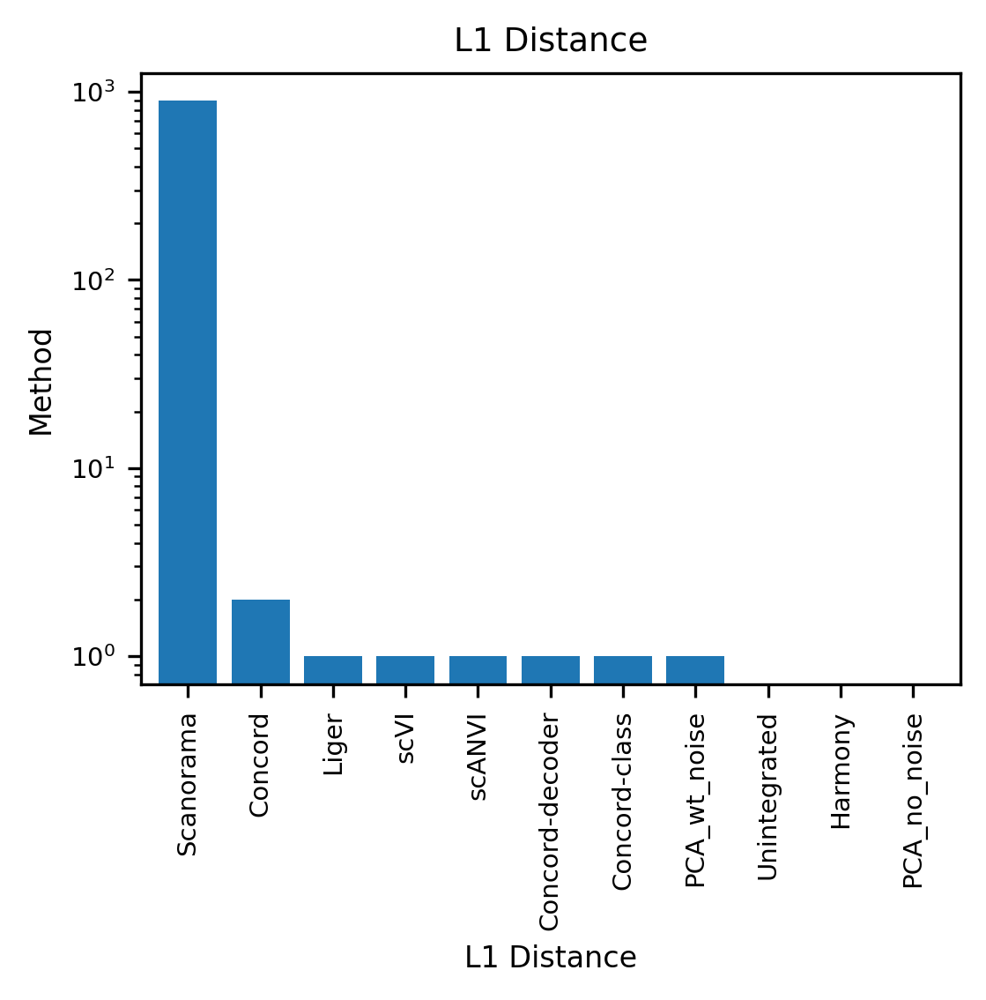

In [74]:
ccd.pl.plot_bar(
    topology_results['distance_metrics'], 
    key = 'L1 Distance',
    order=True, ascending=False, barh=False, legend=False,
    xlabel_fontsize=8, ylabel_fontsize=8, 
    log_scale=True,
    tick_fontsize=7, title_fontsize=9, bar_width=0.8,
    figsize=(4, 3), dpi=300, 
    save_path=save_dir / f"distance_metrics_{file_suffix}.pdf"
)

Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.

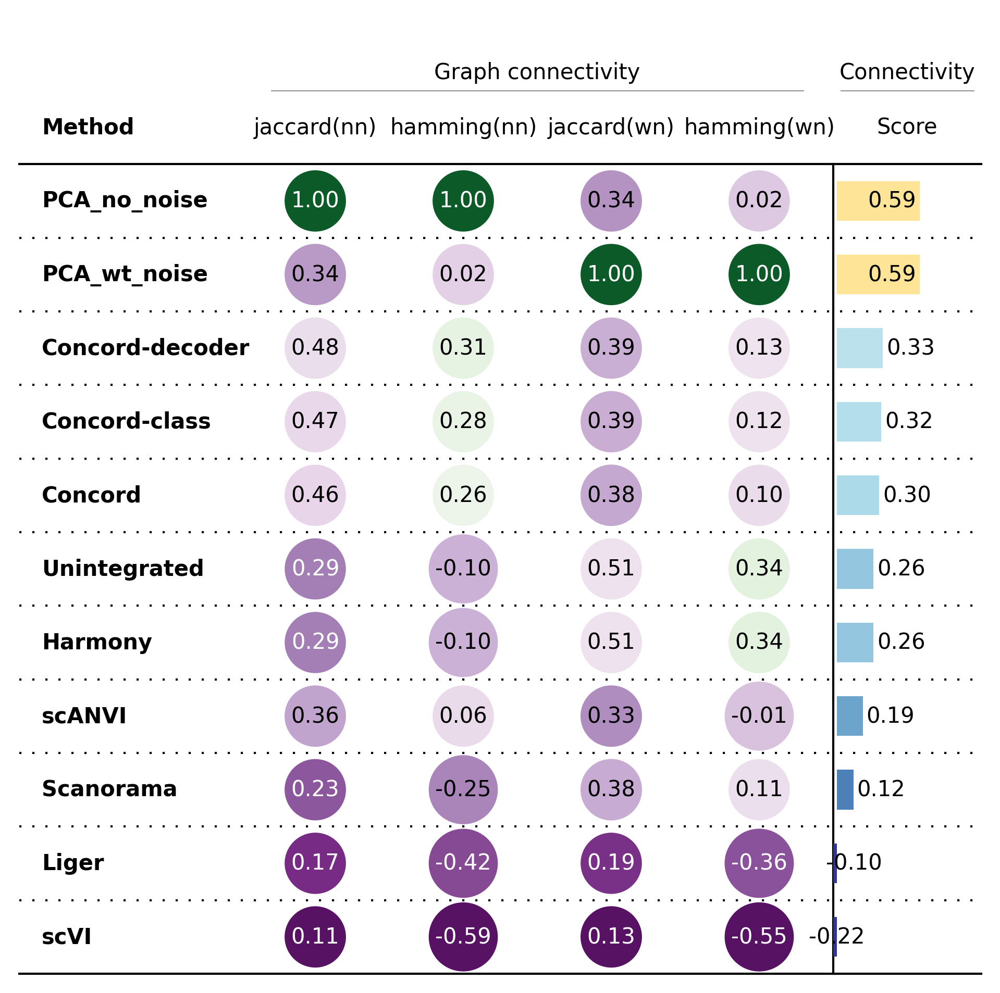

In [ ]:
# compare connectivity for latent vs ground truth, store the result in a pandas dataframe
groundtruth_keys = {'(nn)': 'PCA_no_noise','(wn)': 'PCA_wt_noise'}
connectivity_df = ccd.ul.benchmark_graph_connectivity(adata, emb_keys=combined_keys, groundtruth_keys=groundtruth_keys, k=30)
agg_name1 = 'Connectivity'
agg_name2 = 'Score'
connectivity_scores = ccd.ul.benchmark_stats_to_score(connectivity_df, min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(connectivity_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax_padded', cmap_padding=0.1, agg_name = agg_name1, save_path=save_dir / f"connectivity_results_{file_suffix}.pdf", figsize=(8, 8), dpi=300)


# Geomtric Features 

### Integrated benchmark pipeline

In [91]:
geometry_metrics = ['pseudotime', 'cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr', 'state_batch_distance_ratio']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
groundtruth_key = 'PCA_wt_noise'
groundtruth_key = 'PCA_no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      state_key = leiden_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

# Save results as pickle
import pickle

# Save results as pickle
geometry_df.to_pickle(save_dir / f"geometry_df_{groundtruth_key}_{file_suffix}.pkl")
with open(save_dir / f"geometry_full_{groundtruth_key}_{file_suffix}.pkl", 'wb') as f:
	pickle.dump(geometry_full, f)

Concord - INFO - Computing pseudotime correlation
Concord - INFO - Computing pseudotime for PCA_no_noise
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_899
Concord - INFO - Failed to compute shortest path for PCA_no_noise
Concord - INFO - Computing pseudotime for PCA_wt_noise
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_899
Concord - INFO - Failed to compute shortest path for PCA_wt_noise
Concord - INFO - Computing pseudotime for Unintegrated
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_899
Conco

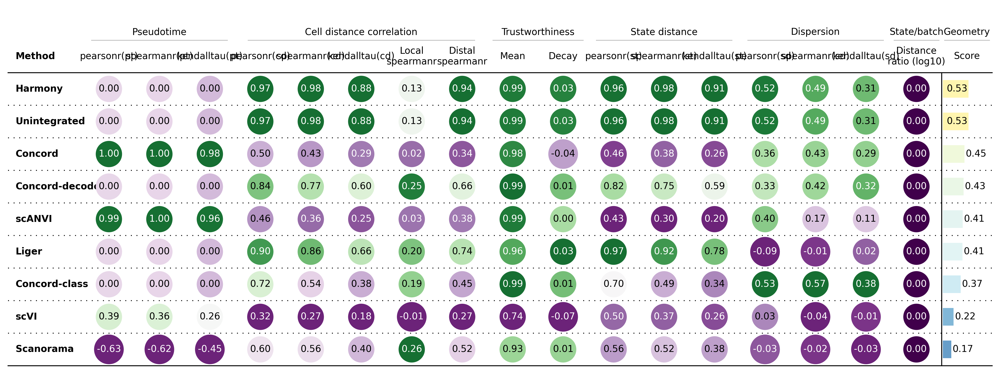

In [136]:
agg_name1 = 'Geometry'
agg_name2 = 'Score'
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=['PCA_no_noise', 'PCA_wt_noise']), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax_padded', cmap_padding=0.1, agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(19, 7), dpi=300)

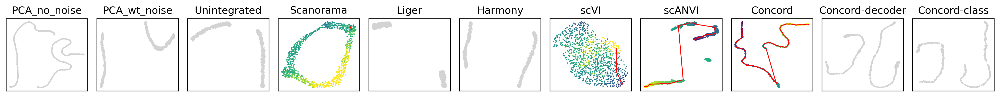

In [93]:
import matplotlib.pyplot as plt

n_cols = 11
n_rows = int(np.ceil(len(combined_keys) / n_cols))
base_size = (1.5, 1.7)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*base_size[0], n_rows*base_size[1]), dpi=300)

axes = np.atleast_2d(axes).flatten()
for basis in combined_keys:
    show_basis = basis + '_UMAP'
    if show_basis not in adata.obsm or basis not in geometry_full['Pseudotime']['pseudotime']:
        show_indices = None
        adata.obs['pseudotime_plot'] = np.nan
    else:
        show_indices = geometry_full['Pseudotime']['path'][basis]
        adata.obs['pseudotime_plot'] = geometry_full['Pseudotime']['pseudotime'][basis]
    
    show_cols = ['pseudotime_plot']

    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, highlight_indices=show_indices, highlight_size=5, draw_path=True, alpha=1.0,
        font_size=12, point_size=10, path_width=1,
        legend_loc='on data', title=basis, colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None, 
        ax=axes[combined_keys.index(basis)]
    )

plt.tight_layout()
plt.savefig(save_dir / f"pseudotime_embedding_{file_suffix}.pdf")

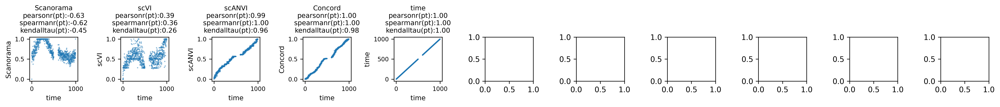

In [94]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['Pseudotime']['pseudotime'], 
    correlation= geometry_full['Pseudotime']['correlation'],
    s=3,
    ground_key = 'time', fontsize=9,
    n_cols = 11, figsize=(1.7,2.1), dpi=300, save_path=save_dir / f"pseudotime_scatter_{groundtruth_key}_{file_suffix}.pdf")

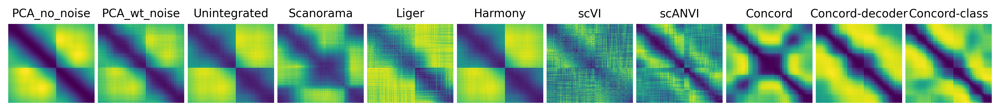

In [95]:
ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 11, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.pdf")

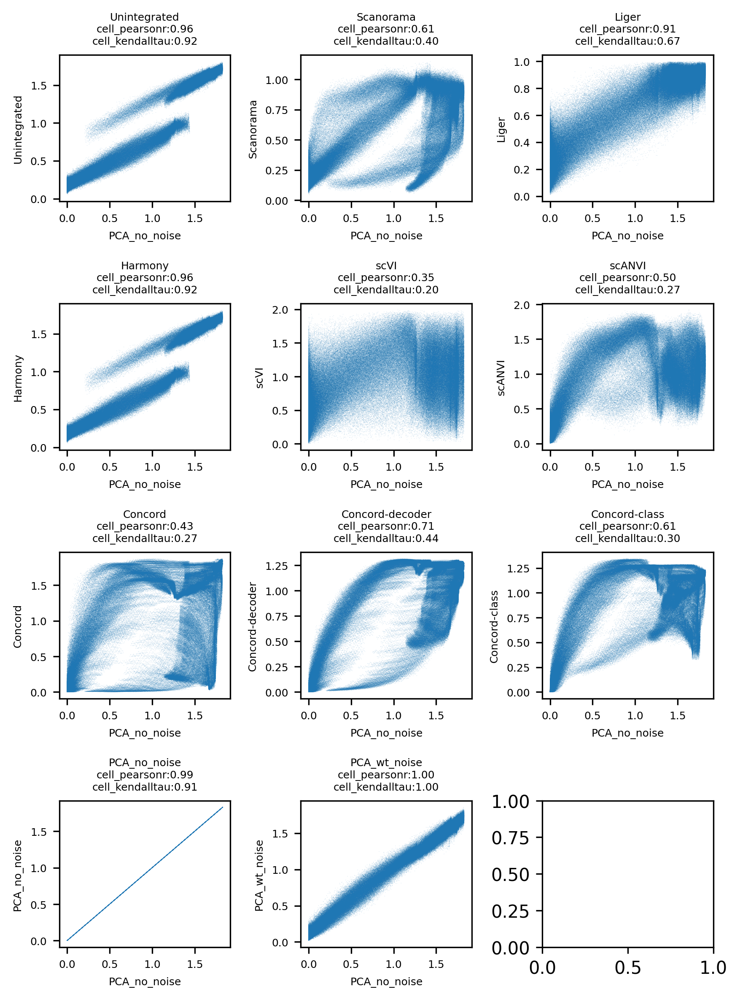

In [82]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['cell_distance_corr']['distance'], 
    correlation= geometry_full['cell_distance_corr']['correlation'],
    s=0.1, alpha = 0.2,
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"cell_distance_scatter_{file_suffix}.png")

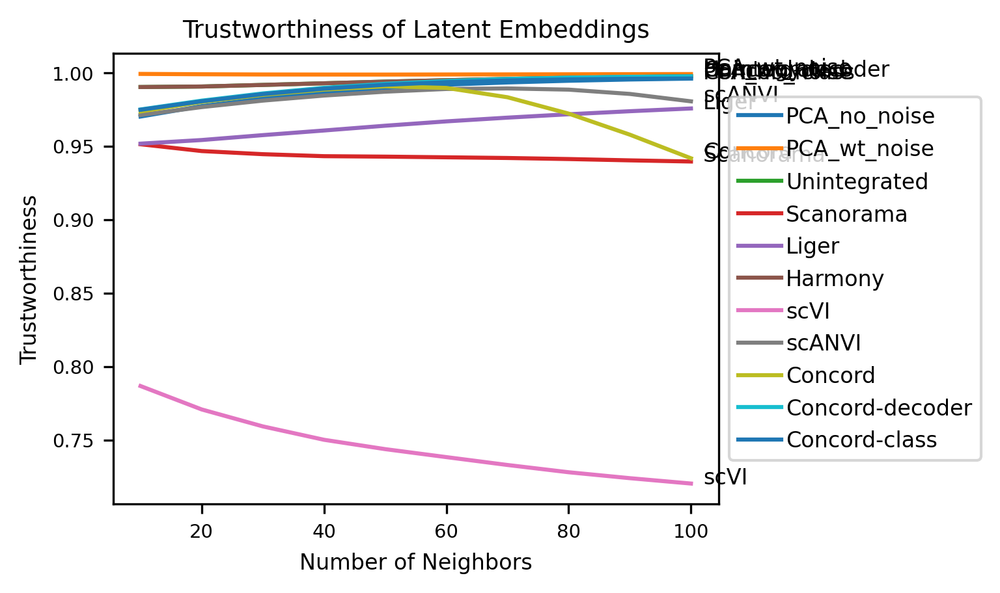

In [50]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=True, save_path=save_dir / f"trustworthiness_{file_suffix}.pdf", figsize=(4,3))

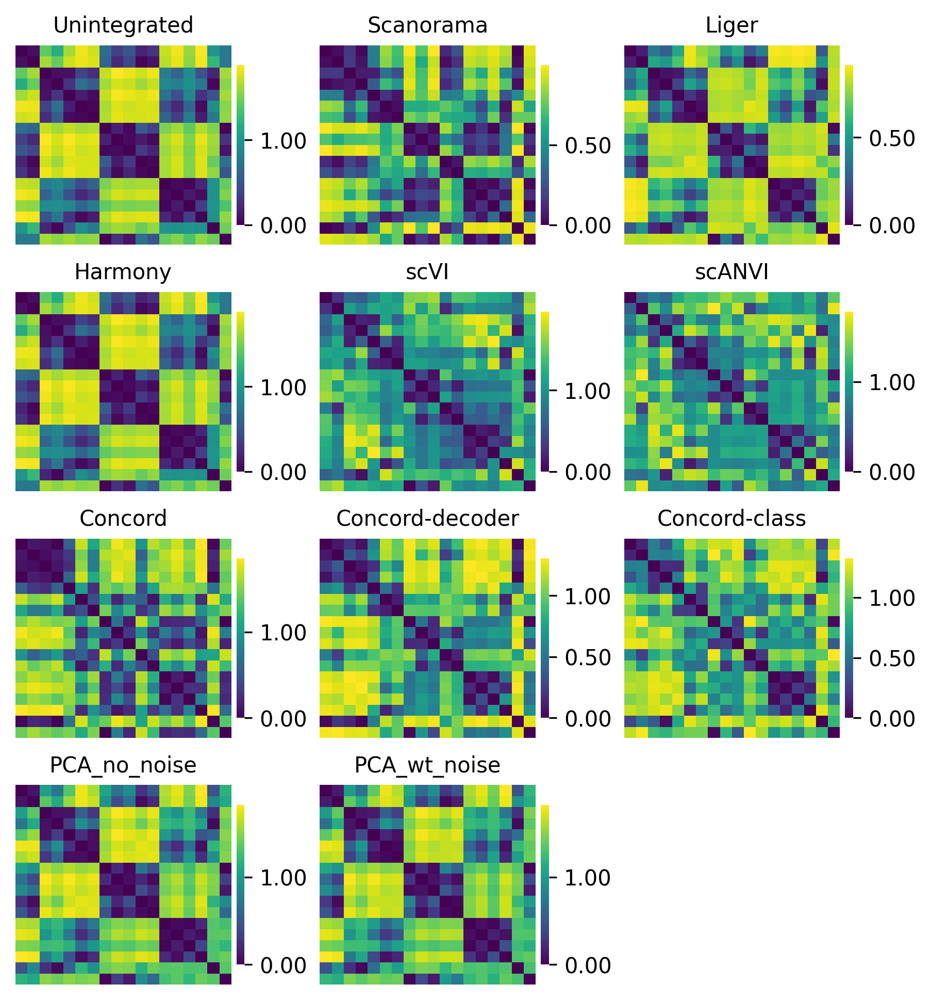

In [85]:
ccd.pl.plot_distance_heatmap(geometry_full['state_distance_corr']['distance'], 
    n_cols = 3, annot_value=False, 
    figsize=(2,1.6), dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.png")

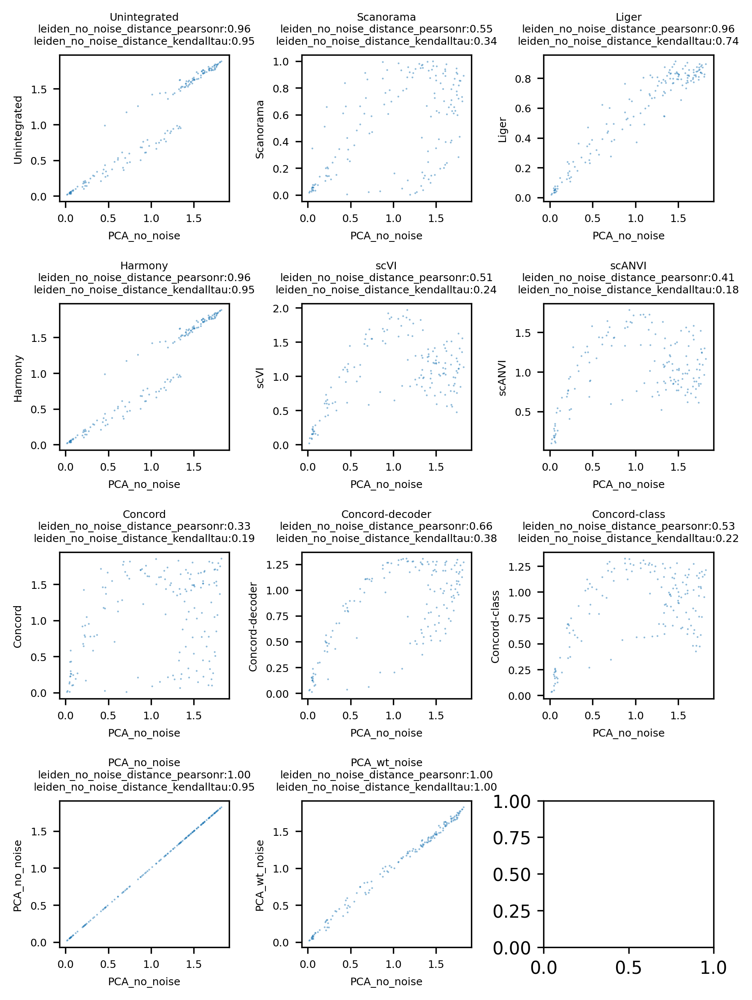

In [86]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_distance_corr']['distance'], 
    correlation= geometry_full['state_distance_corr']['correlation'],
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"state_distance_scatter_{file_suffix}.pdf")

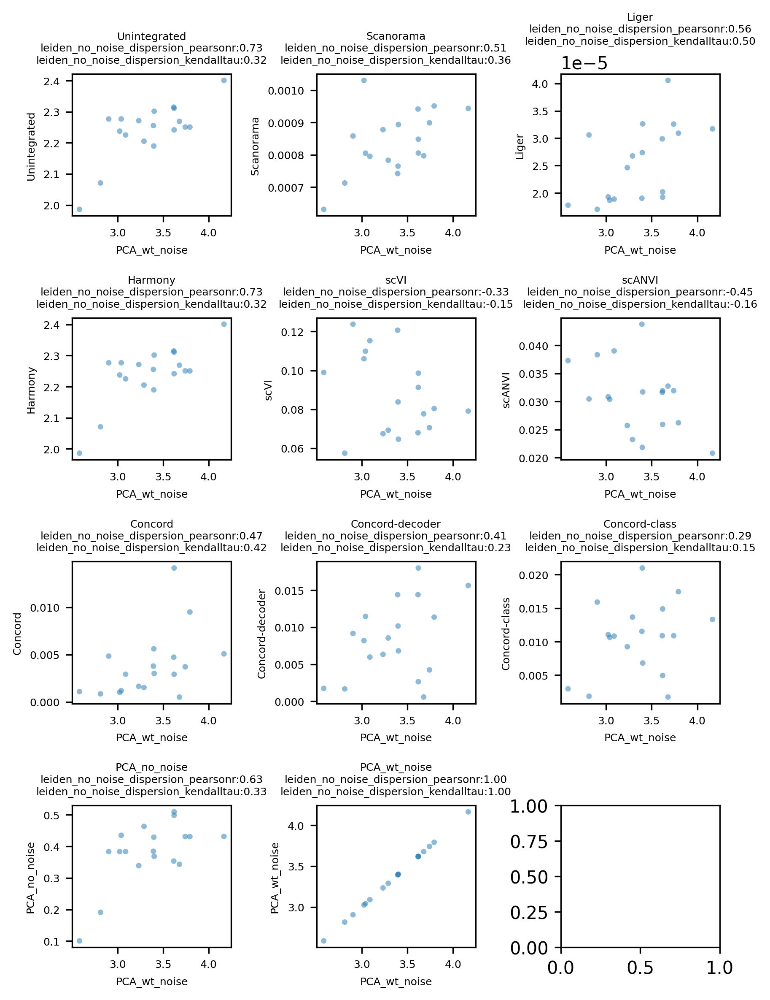

In [87]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_dispersion_corr']['dispersion'], 
    correlation= geometry_full['state_dispersion_corr']['correlation'],
    s=10,
    ground_key = 'PCA_wt_noise',
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"state_distance_scatter_{file_suffix}.pdf")

In [ ]:
geometry_full['state_batch_distance_ratio']

,State-Batch Distance Ratio (log10)
Unintegrated,NaN
Scanorama,NaN
Liger,NaN
Harmony,NaN
scVI,NaN
scANVI,NaN
Concord,NaN
Concord-decoder,NaN
Concord-class,NaN
PCA_no_noise,NaN


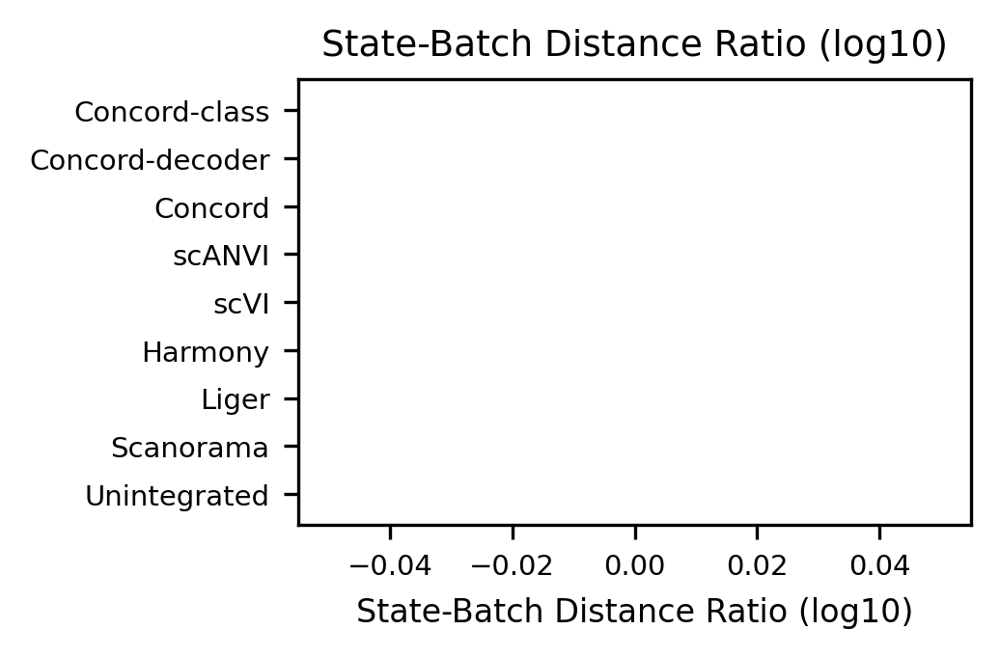

In [89]:
plot_df = geometry_full['state_batch_distance_ratio'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
ccd.pl.plot_bar(plot_df, 'State-Batch Distance Ratio (log10)', save_path=save_dir / f"state_batch_distance_ratio_{file_suffix}.pdf", figsize=(3,2), dpi=300)

### 2.0 Decoder reconstruction

In [91]:
adata.layers

Layers with keys: wt_noise, counts, Scanorama_corrected, Liger_corrected, scVI_corrected_batch_1, scANVI_corrected_batch_1, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2

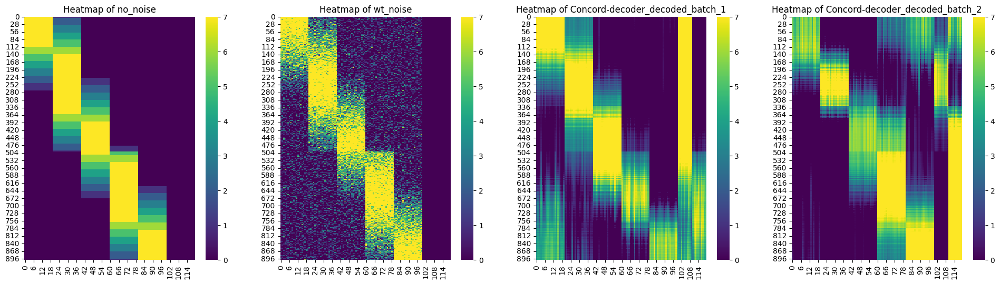

In [51]:
# Align and copy the layer data based on observation names
adata.layers['no_noise'] = np.zeros_like(adata.X)

# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()

decoded_layers = ['Concord-decoder_decoded_batch_1', 'Concord-decoder_decoded_batch_2']
show_layers = ['no_noise', 'wt_noise'] + decoded_layers
ccd.pl.plot_adata_layer_heatmaps(adata, ncells=None, ngenes=None, layers=show_layers, cmap='viridis', vmin=0, vmax=7, 
                                 obs_keys=[state_key, batch_key], transpose=False, figsize=(6,6),  dpi=300, save_path=save_dir/f'decoded_heatmap_{file_suffix}.png')

In [93]:
# Compute the reconstruction error between the original and reconstructed data
mse_no_noise = np.zeros(len(decoded_layers))
mse_wt_noise = np.zeros(len(decoded_layers))
state_genes = adata.var_names[adata.var_names.isin(adata_state.var_names)]
for layer in decoded_layers:
    mse_no_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'no_noise', layer, metric='mse')
    mse_wt_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'wt_noise', layer, metric='mse')

# Report value, mean
print(f"MSE between no_noise and decoded layers: {mse_no_noise}")
print(f"MSE between wt_noise and decoded layers: {mse_wt_noise}")
print(f"Mean MSE between no_noise and decoded layers: {np.mean(mse_no_noise):.4f}")
print(f"Mean MSE between wt_noise and decoded layers: {np.mean(mse_wt_noise):.4f}")


MSE between no_noise and decoded layers: [6.91730823 6.32588461]
MSE between wt_noise and decoded layers: [8.4263176  7.93563951]
Mean MSE between no_noise and decoded layers: 6.6216
Mean MSE between wt_noise and decoded layers: 8.1810
